# Introduction

The objective of this project is to detect wheat heads from outdoor images of wheat plants, including wheat datasets from around the globe. We have to find a generalized solution to estimate the **number** and **size** of wheat heads. The dataset more than **3,000(actual count 3422)** images from **Europe (France, UK, Switzerland) and North America (Canada)**. The test data includes about **1,000(actual count 10)** images from **Australia, Japan, and China**.
The objective is to predict bounding boxes around wheat heads from images of wheat plants. The csv file contains the **image_id** (the unique image ID), the **width** and **height** of the images, and **bounding box**, formatted as a Python-style list of [xmin, ymin, width, height]

#### References
1. [How to Do Data Exploration for Image Segmentation and Object Detection](https://neptune.ai/blog/data-exploration-for-image-segmentation-and-object-detection)
2. [Augmentations, Data Cleaning and Bounding Boxes](https://www.kaggle.com/shantanu2401/augmentations-data-cleaning-and-bounding-boxes/edit)
3. [Object Detection with Detectron](https://www.kaggle.com/suyogdahal/object-detection-with-detectron2-pytorch)
4. [Detectron 2 compare models + augmentation](https://www.kaggle.com/dhiiyaur/detectron-2-compare-models-augmentation)
5. [END2END Object Detection with FasterRCNN](https://www.kaggle.com/chrisden/end2end-object-detection-with-fasterrcnn)


# Import libraries


In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import glob, os
import random
from tqdm.notebook import tqdm
import cv2
from math import ceil
from sklearn.model_selection import train_test_split
from scipy import stats

# Utility functions
Utility functions for 
1. data/image processessing 
2. image visualization
3. data/image validation

In [2]:
#function to check image size in folders
def check_image_size(image_folder_path):
    total_img_list = glob.glob(os.path.join(image_folder_path,"*"))
    counter = 0
    for image in tqdm(total_img_list, desc = "Checking in progress"):
        try:
            img = cv2.imread(image)
            height, width = img.shape[1], img.shape[0]
            if not (height == 1024 and width == 1024):
                counter = counter + 1
        except:
            print("This {} is problematic.".format(image))
    return counter 

#function to draw rectange on the image
def draw_rect(img, bboxes, color=None):
    img = img.copy()
    bboxes = bboxes[:, :4]
    bboxes = bboxes.reshape(-1, 4)
    for bbox in bboxes:
        pt1, pt2 = (bbox[0], bbox[1]), (bbox[2], bbox[3])
        pt1 = int(pt1[0]), int(pt1[1])
        pt2 = int(pt2[0]), int(pt2[1])
        img = cv2.rectangle(img.copy(), pt1, pt2, color, int(max(img.shape[:2]) / 200))
    return img

#functon for plotting multiple images from the given image list
def plot_multiple_img(img_matrix_list, image_list, main_title="",ncols = 4):
    fig, myaxes = plt.subplots(figsize=(20, 15), nrows=ceil(len(img_matrix_list) / ncols), ncols=ncols, squeeze=False)
    fig.suptitle(main_title, fontsize = 20)
    fig.subplots_adjust(wspace=0.3)
    fig.subplots_adjust(hspace=0.3)
    for i, (img, title) in enumerate(zip(img_matrix_list, image_list)):
        myaxes[i // ncols][i % ncols].imshow(img)
        myaxes[i // ncols][i % ncols].set_title(title, fontsize=10)
    plt.show()

#functon for plotting multiple images from the given image list
def plot_random_images(image_folder_path,image_list,main_title = "", num = 12,randm = True):
    
    img_files_list = np.random.choice(list(image_list), num,replace=False) if randm else image_list[:num]
    
    print("The images' names are {}".format(img_files_list))
    img_matrix_list=[]
    for img_file in img_files_list:
        image_file_path = os.path.join(image_folder_path, img_file)
        img = cv2.imread(image_file_path)[:,:,::-1]  
        img_matrix_list.append(img)
    return plot_multiple_img(img_matrix_list,img_files_list, main_title)



#functon for plotting multiple random images along with the bounding boxes
def random_bbox_check(image_folder_path, df, title, num = 12,randm=True):
    img_dict = {}

    for index,row in df.iterrows():
        try:
            image_name = row["image_id"]
            if image_name not in img_dict:
                img_dict[image_name] = list()
            img_dict[image_name].append([float(row["x_min"]), float(row["y_min"]), float(row["x_max"]), float(row["y_max"])])
        except ValueError:
            print("Could not convert float to string, likely that your data has empty values.")
        
    # randomly choose 12 image.
    img_files_list = np.random.choice(list(img_dict.keys()), num,replace=False) if randm else list(img_dict.keys())[:num]
    print("The images' names are {}".format(img_files_list))
    image_file_path_list = []

    bbox_list = []
    img_matrix_list = []
    random_image_matrix_list = []
    
    for img_file in img_files_list:
        image_file_path = os.path.join(image_folder_path, img_file)
        img = cv2.imread(image_file_path)[:,:,::-1]  
        height, width, channels = img.shape
        bbox_list.append(img_dict[img_file])
        img_matrix_list.append(img)
    
    final_bbox_list = []
    for bboxes, img in zip(bbox_list, img_matrix_list):
        final_bbox_array = np.array([])
        for bbox in bboxes:
            bbox = np.array(bbox).reshape(1,4)
            final_bbox_array = np.append(final_bbox_array, bbox)
        final_bbox_array = final_bbox_array.reshape(-1,4)
        random_image = draw_rect(img.copy(), final_bbox_array.copy(), color = (255,0,0))
        random_image_matrix_list.append(random_image)
    plot_multiple_img(random_image_matrix_list, img_files_list, main_title=title)    

# function for splitting thre dataset into training and testing based on test size and random state
def split_dataset(dataset, test_size=0.10, random_state = 2020):
    unique_files = dataset_train.image_id.unique()
    train_images, test_images, _, _ = train_test_split(unique_files, unique_files, test_size=test_size, random_state=random_state)
    train_df = dataset_train[dataset_train.image_id.isin(train_images)]
    test_df = dataset_train[dataset_train.image_id.isin(test_images)]
    print(f'unique images in dataset {len(unique_files)}')
    print(f'unique images in training set {len(train_df.image_id.unique())}')
    print(f'unique images in testing set {len(test_df.image_id.unique())}')
    return (train_df,test_df)

# Metadata Processing
Converting the metadata in desired format.
1. seperating the box co-ordinated into seperate column
2. adding .jpg to the image id 


In [3]:
# view metadata
DATA_ROOT_PATH = '../input/global-wheat-detection'
DATA_CSV_PATH = '../input/global-wheat-detection/train.csv'
DATA_TRAIN_IMAGES_PATH = '../input/global-wheat-detection/train/'
DATA_TEST_IMAGES_PATH = '../input/global-wheat-detection/test/'
SUBMISSION_FILE_PATH = '../input/global-wheat-detection/submission.csv'
SAMPLE_SUBMISSION_FILE_PATH = '../input/global-wheat-detection/sample_submission.csv'

In [4]:
dataset_train = pd.read_csv(DATA_CSV_PATH)
dataset_train.head()

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [5]:
bboxes = np.stack(dataset_train['bbox'].apply(lambda x: np.fromstring(x[1:-1], sep=',')))
for i, column in enumerate(['x_min', 'y_min', 'box_width', 'box_height']):
    dataset_train[column] = bboxes[:,i]
    
dataset_train["x_max"] = dataset_train.apply(lambda col: col.x_min + col.box_width, axis=1)
dataset_train["y_max"] = dataset_train.apply(lambda col: col.y_min + col.box_height, axis = 1)
dataset_train.drop(columns=['bbox'], inplace=True)

In [6]:
#appending .jpg in image id and converting it to string format
dataset_train["image_id"] = dataset_train["image_id"].apply(lambda x: str(x) + ".jpg")
dataset_train["image_id"] = dataset_train["image_id"].astype("str")

In [7]:
#processed dataset
dataset_train.head()

,image_id,width,height,source,x_min,y_min,box_width,box_height,x_max,y_max
0,b6ab77fd7.jpg,1024,1024,usask_1,834.0,222.0,56.0,36.0,890.0,258.0
1,b6ab77fd7.jpg,1024,1024,usask_1,226.0,548.0,130.0,58.0,356.0,606.0
2,b6ab77fd7.jpg,1024,1024,usask_1,377.0,504.0,74.0,160.0,451.0,664.0
3,b6ab77fd7.jpg,1024,1024,usask_1,834.0,95.0,109.0,107.0,943.0,202.0
4,b6ab77fd7.jpg,1024,1024,usask_1,26.0,144.0,124.0,117.0,150.0,261.0


# Exploratory data analysis and sanity check
#### General Data Quality
* get the general feel of a dataset and inspect  it visually. 
* make sure it’s not corrupt
* make sure that all the files are readable and in proper format

#### Image sizes and aspect Ratios

#### Label (objects) sizes and dimensions

In [8]:
#size of dataset
print(f'Total number of train images: {len(os.listdir(DATA_TRAIN_IMAGES_PATH))}')
print(f'Total number of train images in csv: {dataset_train.image_id.nunique()}')
print(f'Total number of test images: {len(os.listdir(DATA_TEST_IMAGES_PATH))}')

Total number of train images: 3422
Total number of train images in csv: 3373
Total number of test images: 10


In [9]:
# check if the coordicates are overshooting the image size
dataset_train[(dataset_train.x_max > 1024) | (dataset_train.y_max > 1024) | (dataset_train.x_min < 0) | (dataset_train.y_min < 0)]

,image_id,width,height,source,x_min,y_min,box_width,box_height,x_max,y_max


In [10]:
# missing values
dataset_train.isnull().sum()

image_id      0
width         0
height        0
source        0
x_min         0
y_min         0
box_width     0
box_height    0
x_max         0
y_max         0
dtype: int64

In [11]:
#check if the image size is consistent
print("min width: {}, max width: {}, min height: {}, max height: {}".format(dataset_train.width.min(),dataset_train.width.max()
                                                                             ,dataset_train.height.min(),dataset_train.height.max()))

min width: 1024, max width: 1024, min height: 1024, max height: 1024


The image size is uniformly distributed where all the images have the same dimensions – here  the only decision we will have to make is how much to resize (if at all) This will mainly depend on objects area, size and aspect ratios)

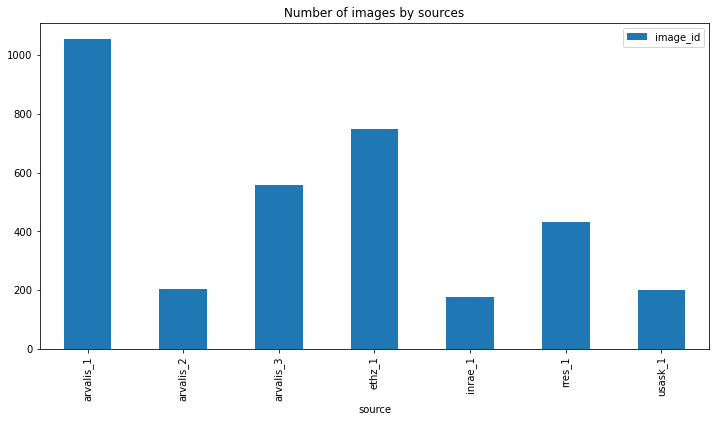

In [12]:
#distribution sources
unique_images = dataset_train[["image_id","source"]].drop_duplicates("image_id")
unique_images.groupby("source").count().plot(kind="bar",figsize=(12,6),title="Number of images by sources")

The images from different sources may have variance, which can cause the model to learn differently from each source, this can be a data imbalance, lets visualize the images to learn more.

In [13]:
sources = dataset_train.source.unique()
df = pd.DataFrame()
for source in sources:
    df = df.append(dataset_train[dataset_train.source==source].drop_duplicates(subset=['image_id']).head(4),ignore_index = True)  
df.sort_values(by=['source'])
df.shape

(28, 10)

The images' names are ['b6ab77fd7.jpg' 'b53afdf5c.jpg' '7b72ea0fb.jpg' '91c9d9c38.jpg'
 '44c60402e.jpg' '6e3da4ae3.jpg' 'd8616bdd1.jpg' 'd1effa7a5.jpg'
 '9b783b776.jpg' 'd136f8db2.jpg' '2f836c5ab.jpg' '2bd2f0714.jpg'
 'f1794c924.jpg' 'ad67b76a3.jpg' '14b4ef410.jpg' '824121036.jpg'
 'aadb83e1d.jpg' '7d0d1f2f4.jpg' '9561a71a0.jpg' 'f7fceadee.jpg'
 'a6c205e19.jpg' '2c836cccb.jpg' 'f54ff03a2.jpg' '09f97e0cf.jpg'
 '3b4f7ba0a.jpg' '92dbf3418.jpg' '667b4a999.jpg' '2ccb37ea9.jpg']


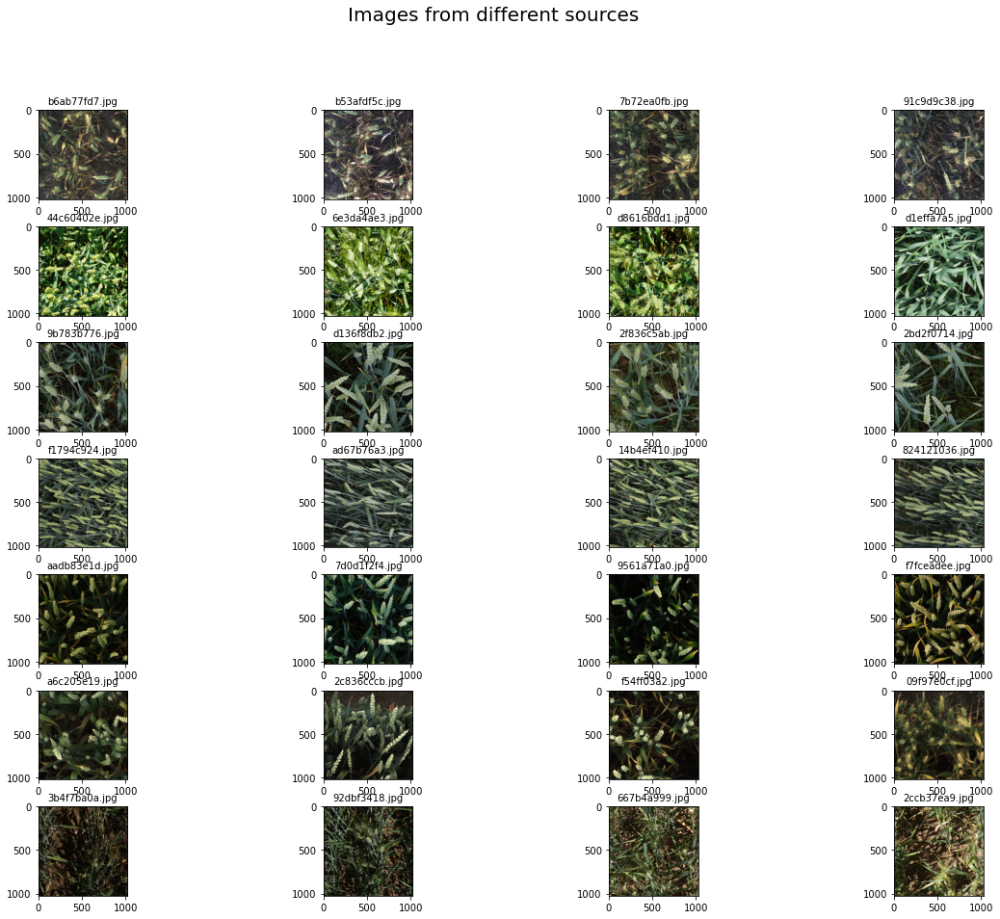

In [14]:
plot_random_images(DATA_TRAIN_IMAGES_PATH,df.image_id.unique(),"Images from different sources" ,num = 28,randm=False)

# Analyse the bounding boxe size and distribution

In [15]:
# bounding boxes
df = dataset_train.image_id.value_counts().to_frame()
counts = df.image_id.values
images_id = df.index

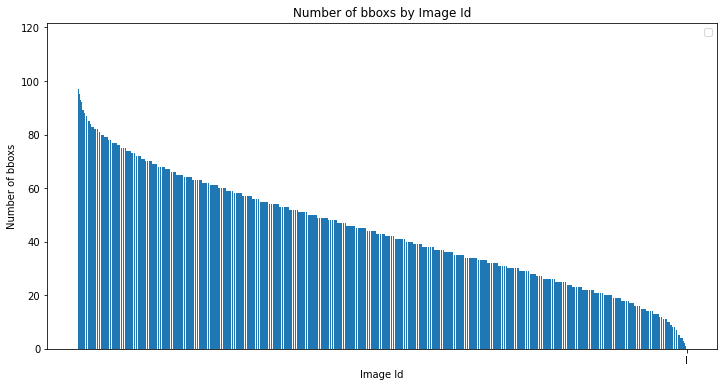

In [16]:
#plot number of bounding boxes by image id
fig, ax = plt.subplots(figsize=(12,6))
ax.bar(images_id,counts)
ax.set_ylabel('Number of bboxs')
ax.set_title('Number of bboxs by Image Id')
ax.set_xlabel('Image Id')
ax.set_xticks("")
ax.set_xticklabels("labels")
ax.legend()
plt.show()

In [17]:
stats.describe(counts)

DescribeResult(nobs=3373, minmax=(1, 116), mean=43.8164838422769, variance=415.13327505882836, skewness=0.20373457731829606, kurtosis=-0.666724886636116)

In [18]:
#top 5 images with highest box count
df.head()

,image_id
35b935b6c.jpg,116
f1794c924.jpg,108
f79336a8e.jpg,104
134d4a01c.jpg,101
4cf91995d.jpg,97


In [19]:
# top 5 image with lowes box count
df.tail(5)

,image_id
a5cb30c38.jpg,1
79c8a1627.jpg,1
22f341965.jpg,1
86296fc32.jpg,1
4e6c05213.jpg,1


The images' names are ['134d4a01c.jpg', 'f1794c924.jpg', 'f79336a8e.jpg', '35b935b6c.jpg', '41457a646.jpg', '708553a80.jpg', '14716eed5.jpg', 'a5dde818e.jpg']


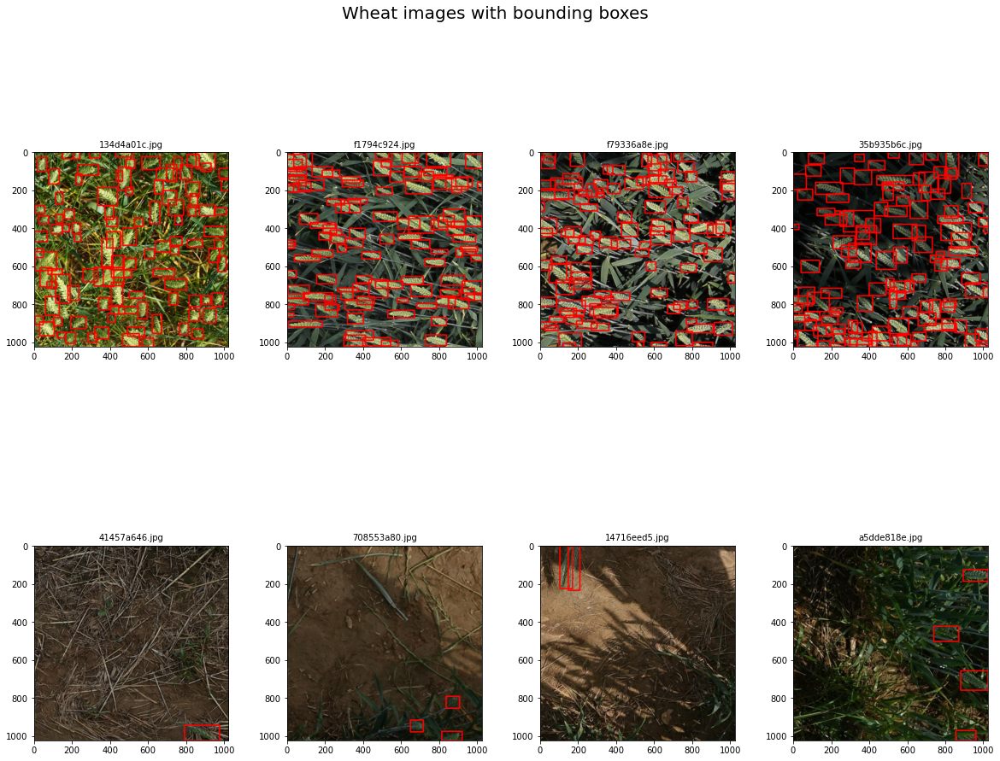

In [20]:
# view the images with bounding boxes
df_merged = df.drop_duplicates(subset=['image_id']).head(4)
df_merged = df_merged.append(df.drop_duplicates(subset=['image_id']).tail(4))
df_merged = dataset_train[dataset_train['image_id'].isin(df_merged.image_id.index.values)]
random_bbox_check(DATA_TRAIN_IMAGES_PATH, df_merged,"Wheat images with bounding boxes",num=8,randm=False)

Do we need to handle bounding box frequency imbalance?

# Analysing aspect ratio and area

In [21]:
#aspect ratio and area of bounding boxes
dataset_train["aspect_ratio"] = dataset_train["box_width"]/dataset_train["box_height"]
dataset_train["bbox_area"] = dataset_train["box_width"]*dataset_train["box_height"]

In [22]:
dataset_train["aspect_ratio"].describe()

count    147793.000000
mean          1.269008
std           1.179070
min           0.005236
25%           0.815789
50%           1.095238
75%           1.507246
max         127.500000
Name: aspect_ratio, dtype: float64

In [23]:
dataset_train["bbox_area"].describe()

count    147793.000000
mean       6843.356576
std        5876.326590
min           2.000000
25%        3658.000000
50%        5488.000000
75%        8272.000000
max      529788.000000
Name: bbox_area, dtype: float64

In [24]:
df = dataset_train.sort_values(by=['bbox_area'],ascending=False)
df = dataset_train[dataset_train['image_id'].isin(df.image_id.unique()[:8])]

The images' names are ['a1321ca95.jpg' 'd7a02151d.jpg' '42e6efaaa.jpg' '9a30dd802.jpg'
 '409a8490c.jpg' 'ad6e9eea2.jpg' 'd067ac2b1.jpg' '2cc75e9f5.jpg']


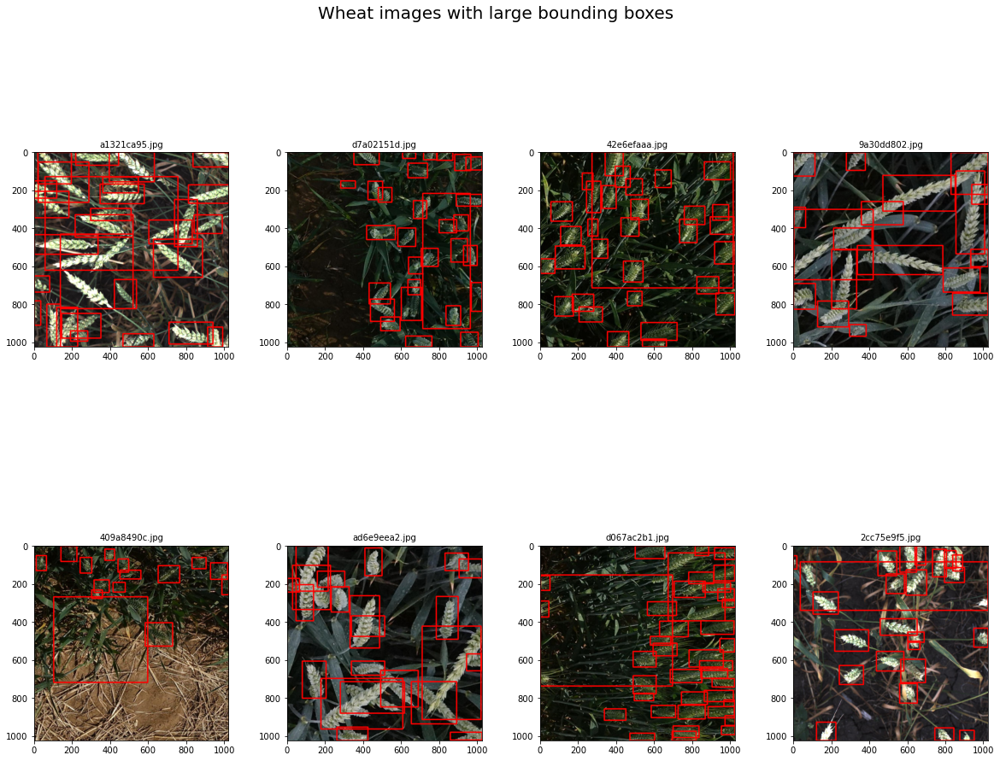

In [25]:
# some boxes are very big, should we ignore? should we use for testing?
random_bbox_check(DATA_TRAIN_IMAGES_PATH, df,"Wheat images with large bounding boxes",num=8,randm=True)

What to do for the big boxes/ incorrect labels

In [26]:
#find missing images in folder
folder_img_list = glob.glob(os.path.join(DATA_TRAIN_IMAGES_PATH,"*"))
folder_img_list = [e.rsplit('/', 1)[-1]  for e in folder_img_list]
csv_img_list = dataset_train["image_id"].tolist()

In [27]:
print("Missing images in folder:", (set(csv_img_list).difference(folder_img_list))) 
print("Additional images in folder:", (set(folder_img_list).difference(csv_img_list))) 

Missing images in folder: set()
Additional images in folder: {'f9cafa47f.jpg', 'dd5d2fa9e.jpg', 'ab20ec355.jpg', 'dec23c826.jpg', 'e4ec17f9b.jpg', '0cf7ef43d.jpg', 'd83808467.jpg', '8de789df8.jpg', '7e1caf1f7.jpg', 'b45c5294d.jpg', '2e6c333a7.jpg', 'f530a5d4b.jpg', '83a94fc79.jpg', 'd7e657453.jpg', 'e01ad95cf.jpg', 'cfc9040ca.jpg', '8425a537b.jpg', '526d737d1.jpg', '46c6a747a.jpg', '5901a73fe.jpg', 'ccb3892c1.jpg', 'c18c32da0.jpg', '0e7832f0b.jpg', '9e21e7969.jpg', '155c440e8.jpg', '69352f3fa.jpg', '952e7d15c.jpg', '6584c18c0.jpg', '1a9792bfc.jpg', 'de2a3cf37.jpg', '8a5cb62db.jpg', '581eaf87b.jpg', 'c74ca81bd.jpg', '91d4e3750.jpg', 'ec196d18a.jpg', '45fddc611.jpg', 'ffbb9c623.jpg', 'f2a6804d2.jpg', 'ed00a614d.jpg', '2d80f9c49.jpg', '65d0b13aa.jpg', 'd771bb084.jpg', '3116768f0.jpg', '00b5c6764.jpg', 'cf1d2f504.jpg', 'a3ce975cd.jpg', '5cbd092f9.jpg', '39a0e5556.jpg', '49e40c7a4.jpg'}


The images' names are ['8de789df8.jpg' '7e1caf1f7.jpg' 'd7e657453.jpg' 'e4ec17f9b.jpg'
 '8425a537b.jpg' '2e6c333a7.jpg' 'b45c5294d.jpg' '9e21e7969.jpg'
 '46c6a747a.jpg' '8a5cb62db.jpg' 'ffbb9c623.jpg' 'ccb3892c1.jpg']


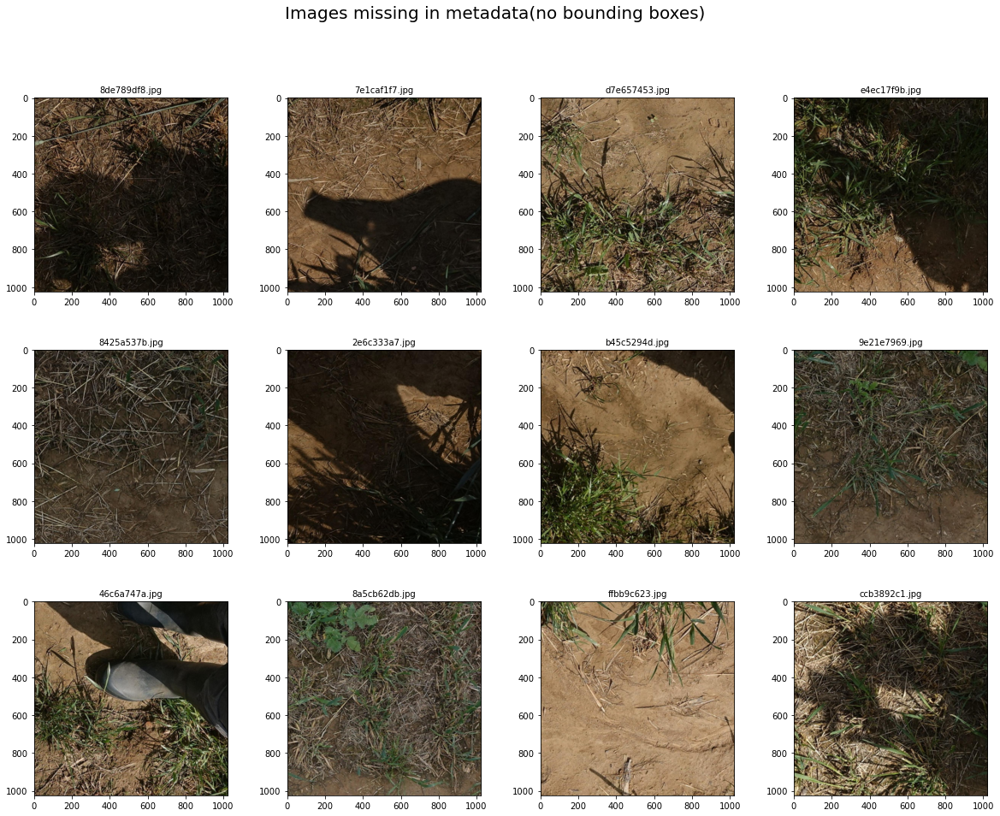

In [28]:
missing_images = set(folder_img_list).difference(csv_img_list)
plot_random_images(DATA_TRAIN_IMAGES_PATH,missing_images,"Images missing in metadata(no bounding boxes)" ,num = 12)

What to do of the missing images?

# Images

The images' names are ['bc226ebfd.jpg' 'de941b2fc.jpg' 'e99667355.jpg' '9d0f63de7.jpg'
 'a20516192.jpg' '0adcb2a1a.jpg' 'd32f90542.jpg' 'bad10b9c4.jpg']


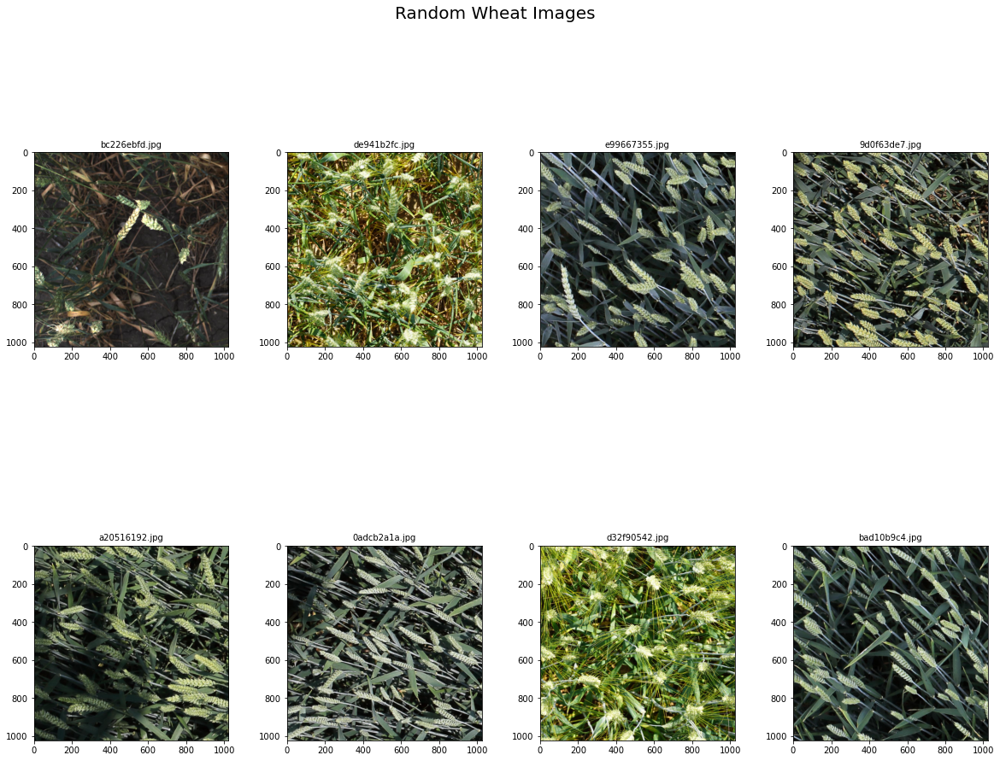

In [29]:
#plot random images
plot_random_images(DATA_TRAIN_IMAGES_PATH,csv_img_list,"Random Wheat Images",num = 8)

The images' names are ['0557047b9.jpg' '5d6935f10.jpg' '3cfbeabfc.jpg' 'b7c9166b6.jpg'
 'c29961ce8.jpg' '834690a35.jpg' 'eb6cd1050.jpg' '2ed43720f.jpg'
 '4525e9579.jpg' '8cad1a1e0.jpg' '4646dcda7.jpg' '9e4780f8b.jpg']


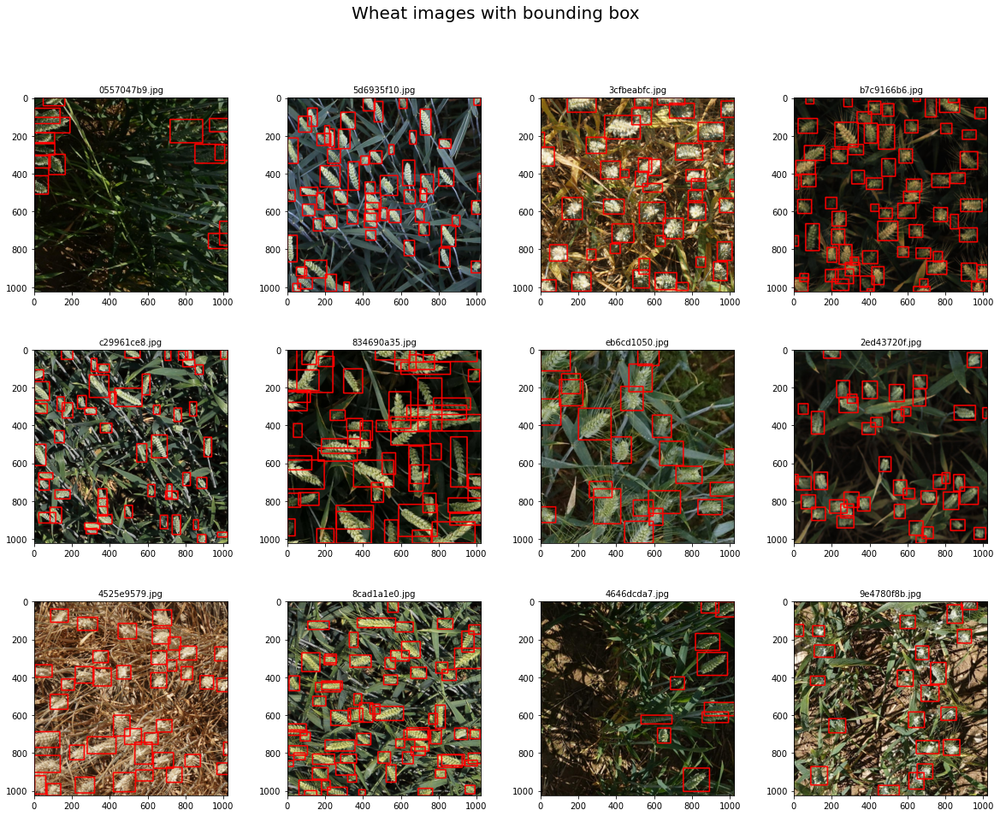

In [30]:
#plot images with rectangle
random_bbox_check(DATA_TRAIN_IMAGES_PATH, dataset_train,"Wheat images with bounding box",12)

In [31]:
dataset_train.to_csv("processsed_train.csv")

# Creating initial model


Useful links to decide on object detection meta architecture and feature extractor
1. [Object Detection and Tracking in 2020](https://blog.netcetera.com/object-detection-and-tracking-in-2020-f10fb6ff9af3)
2. [Object detection: speed and accuracy comparison ](https://medium.com/@jonathan_hui/object-detection-speed-and-accuracy-comparison-faster-r-cnn-r-fcn-ssd-and-yolo-5425656ae359)

In [32]:
# splitting the dataset into dataset_train and dataset_validation
dataset_train = pd.read_csv("processsed_train.csv")
train,val = split_dataset(dataset_train)

unique images in dataset 3373
unique images in training set 3035
unique images in testing set 338


In [33]:
## Lets check our Hardware first
# gpu_info = !nvidia-smi
# gpu_info = '\n'.join(gpu_info)
# if gpu_info.find('failed') >= 0:
#     print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
#     print('and then re-execute this cell.')
# else:
#     print(gpu_info)

# Detectron 2
[Detectron 2 Tutorial](https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5#scrollTo=ZyAvNCJMmvFF)
* Architecture - Faster R-CNN 
* Feature Extractor - ?
* Library - PyTorch
* Proposals - ?
* Stride - ?
* Image size - ?

# Install Detectron 2

In [34]:
# Installing Detectron 2
# !pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html
!pip install -U ../input/wheat-detection/torch-1.5.0cu101-cp37-cp37m-linux_x86_64.whl
!pip install -U ../input/wheat-detection/torchvision-0.6.0cu101-cp37-cp37m-linux_x86_64.whl

# !pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
!pip install -U ../input/wheat-detection/pycocotools-2.0.1-cp37-cp37m-linux_x86_64.whl

!pip install -U ../input/wheat-detection/yacs-0.1.7-py3-none-any.whl

!pip install -U ../input/wheat-detection/fvcore-0.1.1.post20200716-py3-none-any.whl

!pip install -U ../input/wheat-detection/Pillow-7.2.0-cp37-cp37m-manylinux1_x86_64.whl

# !python -m pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/index.html
!python -m pip install ../input/wheat-detection/detectron2-0.2cu101-cp37-cp37m-linux_x86_64.whl

Processing /kaggle/input/wheat-detection/torch-1.5.0cu101-cp37-cp37m-linux_x86_64.whl
  Attempting uninstall: torch
    Found existing installation: torch 1.5.1
    Uninstalling torch-1.5.1:
      Successfully uninstalled torch-1.5.1
Processing /kaggle/input/wheat-detection/torchvision-0.6.0cu101-cp37-cp37m-linux_x86_64.whl
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.6.0a0+35d732a
    Uninstalling torchvision-0.6.0a0+35d732a:
      Successfully uninstalled torchvision-0.6.0a0+35d732a
Processing /kaggle/input/wheat-detection/pycocotools-2.0.1-cp37-cp37m-linux_x86_64.whl
Processing /kaggle/input/wheat-detection/yacs-0.1.7-py3-none-any.whl
Processing /kaggle/input/wheat-detection/fvcore-0.1.1.post20200716-py3-none-any.whl
Processing /kaggle/input/wheat-detection/Pillow-7.2.0-cp37-cp37m-manylinux1_x86_64.whl
ERROR: lime 0.2.0.0 has requirement pillow==5.4.1, but you'll have pillow 7.2.0 which is incompatible.
ERROR: bokeh 2.1.1 has requirement tornado

In [35]:
#dependencies
import torch
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader, build_detection_train_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.structures import BoxMode
import detectron2.data.transforms as T
from detectron2.data import detection_utils as utils
from detectron2.utils.visualizer import ColorMode
from detectron2.data import build_detection_test_loader


import matplotlib.pyplot as plt
from matplotlib import patches
import seaborn as sns
%matplotlib inline

import cv2
import itertools
import copy

Register the dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into detectron2's standard format. See the tutorial for more details.


In [36]:
def register_dataset(dataset, dataset_label, image_dir_path):
    DatasetCatalog.register(dataset_label, lambda d=dataset: get_custom_dataset_dicts(dataset, image_dir_path))
    MetadataCatalog.get(dataset_label).set(thing_classes = ['wheat'])
    return MetadataCatalog.get(dataset_label),dataset_label
    
def get_custom_dataset_dicts(dataset, image_dir_path):
    
    dataset_dict = []
    
    for img_id, img_name in enumerate(dataset.image_id.unique()):
        
        record = {}
        image_df = dataset[dataset['image_id'] == img_name]
        img_path = image_dir_path + img_name #+ '.jpg'
        record['file_name'] = img_path
        record['image_id'] = img_id
        record['height'] = int(image_df['height'].values[0])
        record['width'] = int(image_df['width'].values[0])
                
        annotations = []
        for _, row in image_df.iterrows():
            
            x_min = int(row.x_min)
            y_min = int(row.y_min)
            x_max = int(row.x_max)
            y_max = int(row.y_max)
            
            poly = [(x_min, y_min), (x_max, y_min),
                    (x_max, y_max), (x_min, y_max) ]
            
            poly = list(itertools.chain.from_iterable(poly))
            
            annotation = {
               "bbox": [x_min, y_min, x_max, y_max],
               "bbox_mode": BoxMode.XYXY_ABS,
               "segmentation": [poly],
               "category_id": 0
                }
            
            annotations.append(annotation)
            
        record['annotations'] = annotations
        dataset_dict.append(record) 
        
    return dataset_dict

class WheatTrainer(DefaultTrainer):
    def build_detection_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=DatasetMapper(
            cfg, is_train=True, augmentations=[
                                               # T.Resize((800, 800)),
                                               T.RandomFlip(prob=0.5, horizontal=False, vertical=True),
                                               T.RandomFlip(prob=0.5, horizontal=True, vertical=False),
            ]
            )
        ) 


# def custom_mapper(dataset_dict):
#     # Implement a mapper, similar to the default DatasetMapper, but with your own customizations
#     dataset_dict = copy.deepcopy(dataset_dict)  # it will be modified by code below
#     image = utils.read_image(dataset_dict["file_name"], format="BGR")
    
#     transform_list = [
#         T.Resize((800,800)),
# #         T.RandomFlip(prob=0.5, horizontal=False, vertical=True),
# #         T.RandomFlip(prob=0.5, horizontal=True, vertical=False), 
#     ]
    
#     image, transforms = T.apply_transform_gens(transform_list, image)
#     dataset_dict["image"] = torch.as_tensor(image.transpose(2, 0, 1).astype("float32"))

#     annos = [
#         utils.transform_instance_annotations(annotation, transforms, image.shape[:2])
#         for annotation in dataset_dict.pop("annotations")
#     ]
    
#     instances = utils.annotations_to_instances(annos, image.shape[:2])
    
#     dataset_dict["instances"] = utils.filter_empty_instances(instances)
    
#     return dataset_dict


def show_d2_images(dataset_dicts,metadata,main_title,num=4,ncols=2):
    plt.figure(figsize=(20,20))
    i = 1
    fig, myaxes = plt.subplots(figsize=(20, 20), nrows=ceil(num / ncols), ncols=ncols, squeeze=False)
    fig.suptitle(main_title, fontsize = 20)
    fig.subplots_adjust(wspace=0.3)
    fig.subplots_adjust(hspace=0.3)
    for i,d in enumerate(random.sample(dataset_dicts, num)):
        img = cv2.imread(d["file_name"])
        visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.5)
        out = visualizer.draw_dataset_dict(d)
        myaxes[i // ncols][i % ncols].imshow(out.get_image()[:, :, ::-1])
        myaxes[i // ncols][i % ncols].set_title(d["image_id"], fontsize=10)
    plt.show()
    
def show_d2_predicted_images(predictor,dataset_dicts,metadata,main_title,num=4,ncols=2):
    plt.figure(figsize=(20,20))
    i = 1
    fig, myaxes = plt.subplots(figsize=(20, 20), nrows=ceil(num / ncols), ncols=ncols, squeeze=False)
    fig.suptitle(main_title, fontsize = 20)
    fig.subplots_adjust(wspace=0.3)
    fig.subplots_adjust(hspace=0.3)
    for i,d in enumerate(random.sample(dataset_dicts, num)):
        img = cv2.imread(d["file_name"])
        outputs = predictor(img)
        visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.5)
        out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
        myaxes[i // ncols][i % ncols].imshow(out.get_image()[:, :, ::-1])
        myaxes[i // ncols][i % ncols].set_title(d["image_id"], fontsize=10)
    plt.show()
    
def format_prediction_string(boxes, scores):
    pred_strings = []
    for j in zip(scores, boxes):
        pred_strings.append("{0:.4f} {1} {2} {3} {4}".format(j[0], j[1][0], j[1][1], j[1][2], j[1][3]))

    return " ".join(pred_strings)

def create_submission_file(df_sub,predictor,test_images_path,submission_file_path):
  results = []
  for image_id in df_sub['image_id']:
    img = cv2.imread('{}{}.jpg'.format(test_images_path,image_id))
    boxes = []
    scores = []
    labels = []
    outputs = predictor(img)
    instances = outputs["instances"].to("cpu")
    scores = instances.get_fields()['scores'].numpy()
    boxes = instances.get_fields()['pred_boxes'].tensor.numpy().astype(float)
    boxes = boxes.astype(float)
    boxes[:, 2] = boxes[:, 2] - boxes[:, 0]
    boxes[:, 3] = boxes[:, 3] - boxes[:, 1]
    result = {'image_id': image_id,'PredictionString': format_prediction_string(boxes, scores)}
    results.append(result)
    test_df = pd.DataFrame(results, columns=['image_id', 'PredictionString'])
    test_df.to_csv(submission_file_path, index=False)

In [37]:
train_metadata, train_label = register_dataset(train,'wheat_train',DATA_TRAIN_IMAGES_PATH)
val_metadata, val_label = register_dataset(val, 'wheat_val',DATA_TRAIN_IMAGES_PATH)

#### To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set

In [38]:
dataset_dicts = get_custom_dataset_dicts(train, DATA_TRAIN_IMAGES_PATH)

<Figure size 1440x1440 with 0 Axes>

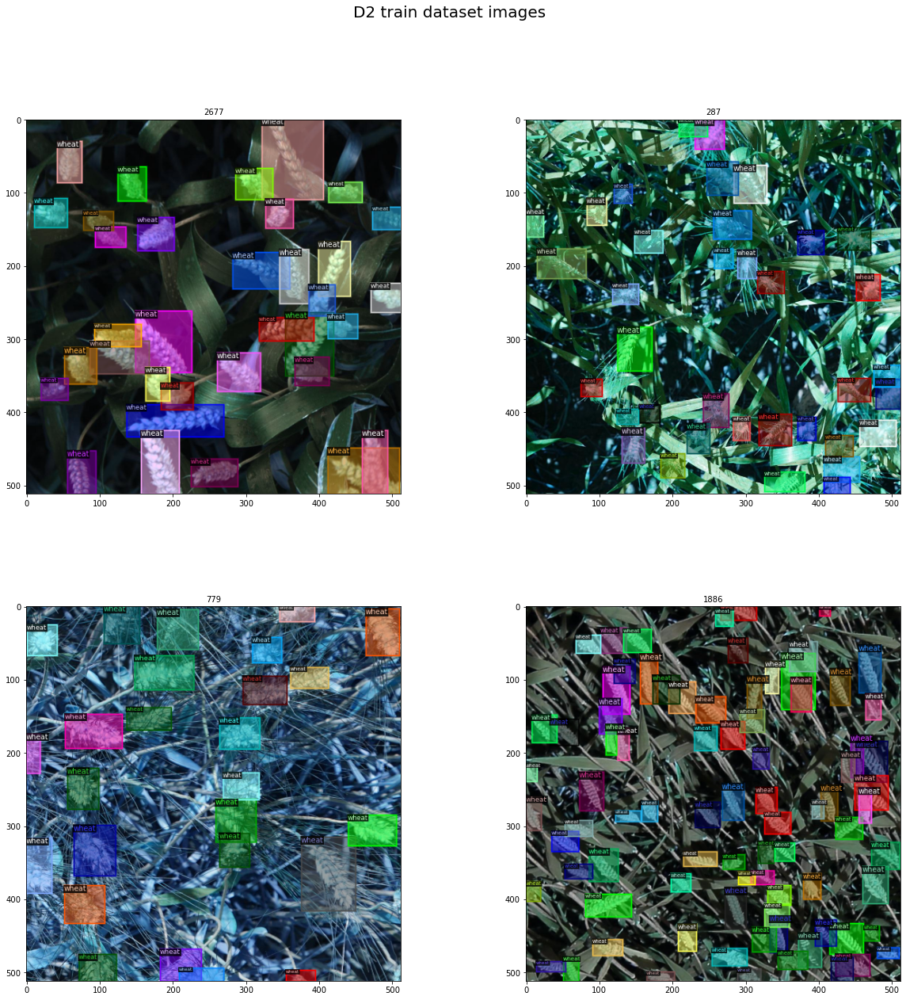

In [39]:
show_d2_images(dataset_dicts,train_metadata,"D2 train dataset images")

# Creating a model

Select a pretrained model from [detectron model zoo](https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md)

In [40]:
MODEL = 'COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml'

In [41]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(MODEL))
cfg.DATASETS.TRAIN = (train_label,)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 4
# cfg.OUTPUT_DIR = DATA_ROOT_PATH
# cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(MODEL)  #load pretrained weights
cfg.MODEL.WEIGHTS = os.path.join('../input/wheatdetectiontrainedmodels', "model_final.pth")
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR =  0.001
cfg.SOLVER.MAX_ITER = 10000
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128     
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = WheatTrainer(cfg)
# trainer = DefaultTrainer(cfg)


[07/25 23:36:18 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [42]:
# create data loader
# code from https://www.kaggle.com/julienbeaulieu/detectron2-wheat-detection-eda-training-eval
# train_data_loader = trainer.build_train_loader(cfg)
# data_iter = iter(train_data_loader)
# batch = next(data_iter)

#### or

# train_data_loader = build_detection_train_loader(cfg, mapper=custom_mapper)

#### or 

# from detectron2.data import DatasetMapper 

# train_data_loader = build_detection_train_loader(cfg, mapper=DatasetMapper(cfg, is_train=True, augmentations=[
#       # T.Resize((800, 800)),
#       T.RandomFlip(prob=0.5, horizontal=False, vertical=True),
#       T.RandomFlip(prob=0.5, horizontal=True, vertical=False),
#    ]))


In [43]:
trainer.resume_or_load(resume=False)
trainer.train()

[07/25 23:37:50 d2.engine.train_loop]: Starting training from iteration 0
[07/25 23:38:15 d2.utils.events]:  eta: 3:23:51  iter: 19  total_loss: 0.875  loss_cls: 0.237  loss_box_reg: 0.462  loss_rpn_cls: 0.041  loss_rpn_loc: 0.131  time: 1.2078  data_time: 0.0424  lr: 0.000020  max_mem: 7237M
[07/25 23:38:40 d2.utils.events]:  eta: 3:29:50  iter: 39  total_loss: 0.860  loss_cls: 0.244  loss_box_reg: 0.463  loss_rpn_cls: 0.037  loss_rpn_loc: 0.116  time: 1.2255  data_time: 0.0153  lr: 0.000040  max_mem: 7237M
[07/25 23:39:04 d2.utils.events]:  eta: 3:29:10  iter: 59  total_loss: 0.928  loss_cls: 0.266  loss_box_reg: 0.484  loss_rpn_cls: 0.040  loss_rpn_loc: 0.118  time: 1.2185  data_time: 0.0113  lr: 0.000060  max_mem: 7237M
[07/25 23:39:29 d2.utils.events]:  eta: 3:28:45  iter: 79  total_loss: 0.868  loss_cls: 0.248  loss_box_reg: 0.450  loss_rpn_cls: 0.034  loss_rpn_loc: 0.125  time: 1.2208  data_time: 0.0145  lr: 0.000080  max_mem: 7237M
[07/25 23:39:53 d2.utils.events]:  eta: 3:28:1

In [44]:
# # Look at training curves in tensorboard:
# %load_ext tensorboard
# %tensorboard --logdir output

# Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:

In [45]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.3   # set a custom testing threshold for this model
cfg.DATASETS.TEST = (val_label, )
predictor = DefaultPredictor(cfg)

In [46]:
dataset_dicts_val = get_custom_dataset_dicts(val, DATA_TRAIN_IMAGES_PATH)

<Figure size 1440x1440 with 0 Axes>

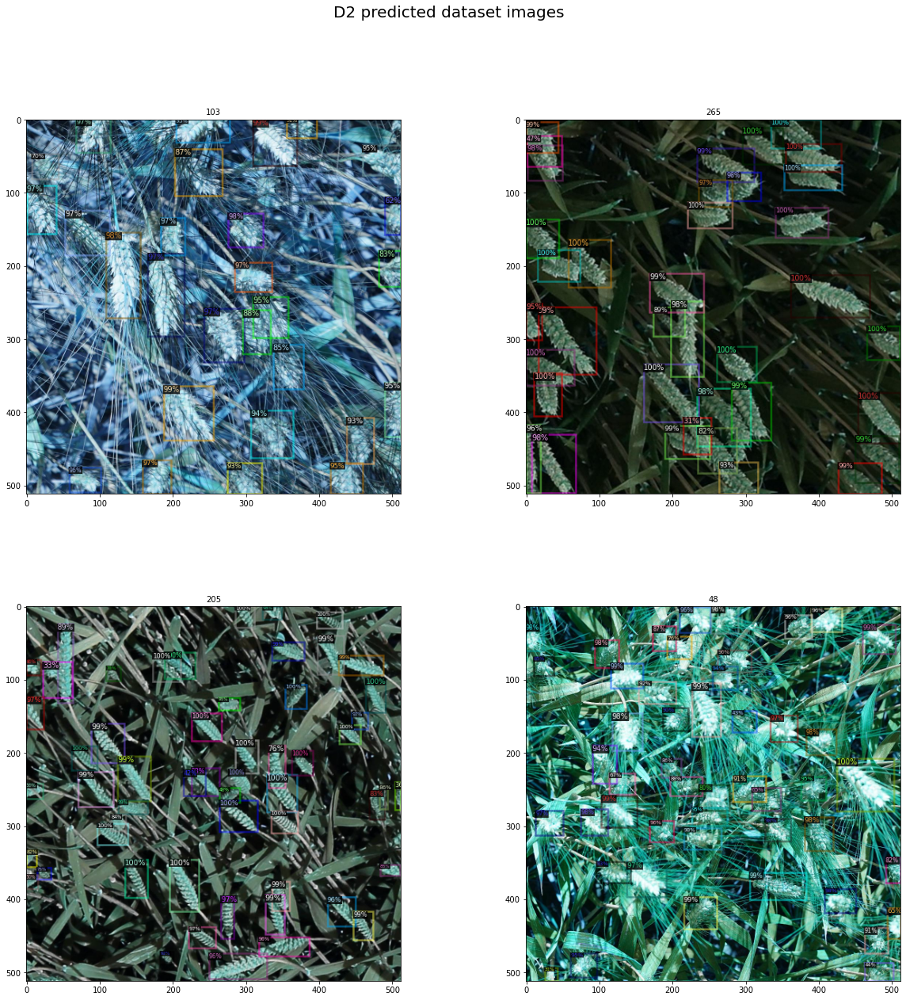

In [47]:
show_d2_predicted_images(predictor,dataset_dicts_val,val_metadata,"D2 predicted dataset images")

# Evaluation

In [48]:

evaluator = COCOEvaluator(val_label, cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, val_label)
print(inference_on_dataset(trainer.model, val_loader, evaluator))

[07/26 03:01:56 d2.evaluation.coco_evaluation]: 'wheat_val' is not registered by `register_coco_instances`. Therefore trying to convert it to COCO format ...
[07/26 03:01:56 d2.data.datasets.coco]: Converting annotations of dataset 'wheat_val' to COCO format ...)
[07/26 03:02:00 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[07/26 03:02:02 d2.data.datasets.coco]: Conversion finished, #images: 338, #annotations: 15139
[07/26 03:02:02 d2.data.datasets.coco]: Caching COCO format annotations at './output/wheat_val_coco_format.json' ...
[07/26 03:02:07 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   wheat    | 15139        |
|            |              |
[07/26 03:02:07 d2.data.common]: Serializing 338 elements to byte tensors and concatenating them all ...
[07/26 03:02:08 d2.data.common]: Serialized dataset takes 0.94 MiB
[07/26 03:02:08 d2.data.dataset_mapper]: Augmentations used in train

In [49]:
df_sub = pd.read_csv('/kaggle/input/global-wheat-detection/sample_submission.csv')
df_sub.sort_values(by=["image_id"])

,image_id,PredictionString
7,2fd875eaa,1.0 0 0 50 50
5,348a992bb,1.0 0 0 50 50
4,51b3e36ab,1.0 0 0 50 50
1,51f1be19e,1.0 0 0 50 50
9,53f253011,1.0 0 0 50 50
3,796707dd7,1.0 0 0 50 50
0,aac893a91,1.0 0 0 50 50
8,cb8d261a3,1.0 0 0 50 50
6,cc3532ff6,1.0 0 0 50 50
2,f5a1f0358,1.0 0 0 50 50


In [50]:
results = []
for image_id in df_sub['image_id']:
    img = cv2.imread('/kaggle/input/global-wheat-detection/test/{}.jpg'.format(image_id))
    boxes = []
    scores = []
    labels = []
    outputs = predictor(img)
    out = outputs["instances"].to("cpu")
    scores = out.get_fields()['scores'].numpy()
    boxes = out.get_fields()['pred_boxes'].tensor.numpy().astype(int)
    boxes = boxes.astype(int)
    boxes[:, 2] = boxes[:, 2] - boxes[:, 0]
    boxes[:, 3] = boxes[:, 3] - boxes[:, 1]
    result = {'image_id': image_id,'PredictionString': format_prediction_string(boxes, scores)}
    results.append(result)

In [51]:
test_df = pd.DataFrame(results, columns=['image_id', 'PredictionString'])
test_df.to_csv('submission.csv', index=False)